In [1]:
%load_ext autoreload
%autoreload 2


# MUST BE FIRST - before any imports from cell_type_mapper --> error if FromSpecifiedMarkersRunner run wiht GPU
import os
os.environ['CUDA_VISIBLE_DEVICES'] = ''

import pandas as pd
import scanpy as sc
import os
from dotenv import load_dotenv; load_dotenv()
import ipynbname
import shutil
import numpy as np
import matplotlib.pyplot as plt
import json
from tqdm.notebook import tqdm
import subprocess


from utils import preprocessing


# Hyperparamyters
BASE_PATH = os.getenv("BASE_PATH_FOR_SAVING")
DISEASE_TYPE = "diseased" # diseased / healthy
SAMPLE_ID = "sample_01" #"sample_01" #"recon_241105"

ADATA_PATH = f'{BASE_PATH}/{DISEASE_TYPE}/{SAMPLE_ID}/adata/all_lib_adata.h5ad' #"/home/gdallagl/myworkdir/XDP/data/XDP/diseased/recon_241105/FAKE_BCL/FAKE_LIBRARY/adata/reprocessed_filtered_adata.h5ad" #f'{BASE_PATH}/{DISEASE_TYPE}/{SAMPLE_ID}/adata/all_lib_adata.h5ad'

MSN_CONSIDERED_OBS_COL = "mapping_MSN_for_zoning" # some cell types merged toegterh

In [2]:
adata = sc.read_h5ad(ADATA_PATH)
print(adata)

AnnData object with n_obs × n_vars = 85645 × 32780
    obs: 'x', 'y', 'pct_intronic', 'is_cell', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'my_hierarchy_all', 'library', 'library_name', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'leiden_scANVI'
    var: 'feature_types', 'genome', 'gene_symbol', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatche

In [3]:
# Create spatial matrix with NaN by default
spatial_coords = np.full((adata.n_obs, 2), np.nan)
# For cells with has_spatial == True, add their real coordinates
mask = adata.obs['has_spatial'] == True
spatial_coords[mask] = adata.obs.loc[mask, ['x', 'y']].values
# Assign to obsm
adata.obsm['spatial'] = spatial_coords

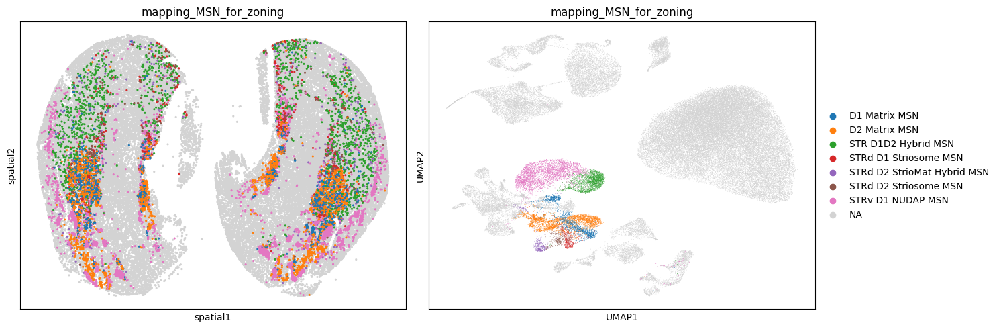

In [4]:
# Load the JSON file
with open(os.getenv("GROUP_LEVEL_MMC_MAPPING_PATH"), 'r') as f:
    classifications = json.load(f)

schemes = [MSN_CONSIDERED_OBS_COL]

for classification in schemes:
    # Filter out annotation entries (those with keys starting with "_
    clean_mapping = {
        k: v for k, v in classifications[classification].items() 
        if not k.startswith("_")
    }    
    # Apply classification
    adata.obs[classification] = adata.obs['Group_name'].map(clean_mapping)


for i, res in enumerate(schemes):

    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    sc.pl.embedding(adata, basis="spatial", color=res, ax=axes[0], show=False, legend_loc=None, size=20, palette=sc.pl.palettes.vega_10  ) #     # First plot will generate colors and store them in adata.uns[f'{res}_colors']
    sc.pl.umap(adata, color=res, ax=axes[1], show=False)#, legend_loc="on data") #    # Second plot will automatically use the same colors from adata.uns


    plt.tight_layout()
    plt.show()

# Select only MSN 

In [5]:
# Filter
adata_MSN = adata[~adata.obs[MSN_CONSIDERED_OBS_COL].isna()].copy()

all_MSN_barcodes = set(adata_MSN.obs_names.values)

print(adata_MSN)

# Reprocess (umap)
preprocessing.reprocess_subset(adata_MSN, old_umap_name="all_cells")


AnnData object with n_obs × n_vars = 11586 × 32780
    obs: 'x', 'y', 'pct_intronic', 'is_cell', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'my_hierarchy_all', 'library', 'library_name', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'leiden_scANVI', 'mapping_MSN_for_zoning'
    var: 'feature_types', 'genome', 'gene_symbol', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'

/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Calculating PCA...
Calculating neighbors...
Calculating Umap...
Clutering...
Preprocessing done.


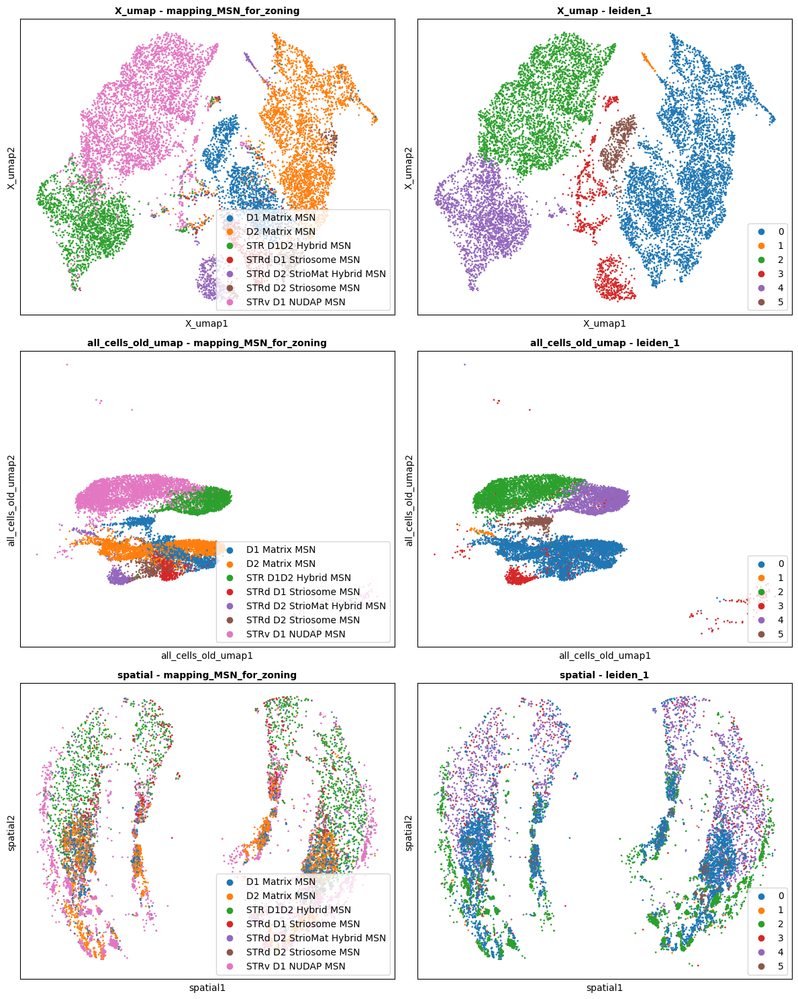

In [6]:
preprocessing.plot_embedding_grid(
    adata=adata_MSN,
    bases=['X_umap', 'all_cells_old_umap', 'spatial'],
    colors=[MSN_CONSIDERED_OBS_COL, "leiden_1"],
    size=15
)

# QC per cell type

In [7]:
adata_MSN.obs[MSN_CONSIDERED_OBS_COL].unique().tolist()

['D1 Matrix MSN',
 'D2 Matrix MSN',
 'STRv D1 NUDAP MSN',
 'STRd D2 StrioMat Hybrid MSN',
 'STRd D1 Striosome MSN',
 'STR D1D2 Hybrid MSN',
 'STRd D2 Striosome MSN']

In [8]:
def calculate_mad_thresholds(adata_ct, n_mads=3):
    """Calculate thresholds using MAD for outlier detection"""
    def mad_bounds(values, n_mads=3):
        median = np.median(values)
        mad = np.median(np.abs(values - median))
        lower = median - n_mads * mad
        upper = median + n_mads * mad
        return lower, upper
    
    umi_lower, umi_upper = mad_bounds(adata_ct.obs["total_counts"], n_mads)
    genes_lower, genes_upper = mad_bounds(adata_ct.obs["n_genes_by_counts"], n_mads)
    mt_median = np.median(adata_ct.obs["pct_counts_mt"])
    mt_mad = np.median(np.abs(adata_ct.obs["pct_counts_mt"] - mt_median))
    
    dict_thr =  {
        'min_UMI': max(0, umi_lower),
        'max_UMI': umi_upper,
        'min_genes': max(0, genes_lower),
        'mt_threshold': mt_median + 3 * mt_mad,
    }
    print(dict_thr)
    return dict_thr

def calculate_adaptive_thresholds(adata_ct, min_percentile=2, max_percentile=0.5, mit_thr=3):
    """
    Simple percentile-based thresholds - works best for clean data
    """
    dict_thr = {
        'min_UMI': int(np.percentile(adata_ct.obs["total_counts"], min_percentile)),  # Bottom 2%
        'max_UMI': int(np.percentile(adata_ct.obs["total_counts"], max_percentile)), # Top 2%
        'min_genes': int(np.percentile(adata_ct.obs["n_genes_by_counts"], 2)),
        'mt_threshold': float(mit_thr),
    }
    print(dict_thr)
    return dict_thr

In [9]:
def filter_single_ct(adata, ct, cell_type_col, min_percentile=2, max_percentile=99.5, mit_thr=3):

    print(
        f"""
        #########################
        ### {ct}
        #########################
        """
    )

    # Select single ct
    adata_ct = adata[adata.obs[cell_type_col] == ct].copy()

    # Reprocess + calculate QC
    preprocessing.reprocess_subset(adata_ct, old_umap_name="all_MSN")

    # Plot QC
    preprocessing.plot_qc_metrics(adata_ct) # QC metric distribtuion

    # Calculate thr wiht mad
    filters_thr = calculate_adaptive_thresholds(adata_ct, min_percentile=min_percentile, max_percentile=max_percentile, mit_thr=mit_thr)

    # Plot QC Andre
    QC_andrew = {
        'Oligodendrocyte': ['TF', 'PLP1', 'MOBP', 'TMEM144'],  # Should be ZERO in neurons
        'Ribo-stressed': ['RPL26'], 
        "Dissociation-Activity": ["NR4A1"], # IEG -  induced by neuronal activity --> artificially HIGH due to dissociation stress
        #"XDP": "TAF1",
        'Type_I_Interferon_Response': ["IFIT1", "IFIT2", "IFIT3", "ISG15", "IFI44", "OAS1", "MX1", "MX2", "RSAD2", "IRF7", "IFITM3"],
    }
    adata_ct.var.index = adata_ct.var["gene_symbol"]
    adata_ct.var.index = adata_ct.var["gene_symbol"].astype(str)
    adata_ct.var.index.name = '_index'
    adata_ct.var_names_make_unique()
    preprocessing.calculate_and_plot_markers(adata_ct, QC_andrew)

    print(adata_ct)

    # Mark bad cells based on "markers
    adata_ct.obs["has_bad_markers"] = ["True" 
                                       #if (oligo_score >= 0.5) or (inflamation_score >= 0.5) else np.nan 
                                       if (oligo_score >= 0.5) else np.nan 
                                       for (oligo_score, inflamation_score) in zip(adata_ct.obs["Oligodendrocyte_score"].values, adata_ct.obs["Type_I_Interferon_Response_score"].values)
                                       ]

    # Mark bad cells based on "filter"
    filters = { # lists of boolen (True == to keep)
        'min_UMI': adata_ct.obs["total_counts"] >= filters_thr["min_UMI"], #6000, # from plot above
        'max_UMI': adata_ct.obs["total_counts"] <= filters_thr["max_UMI"], #6000, # from plot above
        'min_genes': adata_ct.obs["n_genes_by_counts"] >= filters_thr["min_genes"], #3000,
        'mt_threshold': adata_ct.obs["pct_counts_mt"] <= filters_thr["mt_threshold"], #1,
    }
    cells_to_keep = pd.DataFrame(filters).all(axis=1)  # AND
    adata_ct.obs["is_noise"] = ["True" if not i else np.nan for i in cells_to_keep]

    # Plot
    preprocessing.plot_embedding_grid(
        adata=adata_ct,
        bases=['X_umap', 'all_MSN_old_umap', 'all_cells_old_umap', 'spatial'],
        colors=["is_noise", "has_bad_markers",
                "log1p_total_counts", "log1p_n_genes_by_counts",
                ], #is_scrublet_doublet
        size=30
    )

    # return barcodes of OK cells
    return (adata_ct.obs[
        (adata_ct.obs["is_noise"].isna()) &
        (adata_ct.obs["has_bad_markers"].isna()) 
        ].index, 
        adata_ct)




        #########################
        ### D1 Matrix MSN
        #########################
        
   Genes before filtering: 31141
   Genes after filtering: 26149
Expect .X is raw counts!
Normalizing...
Findingn HVGs...
Scaling...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Calculating PCA...
Calculating neighbors...
Calculating Umap...
Clutering...
Preprocessing done.


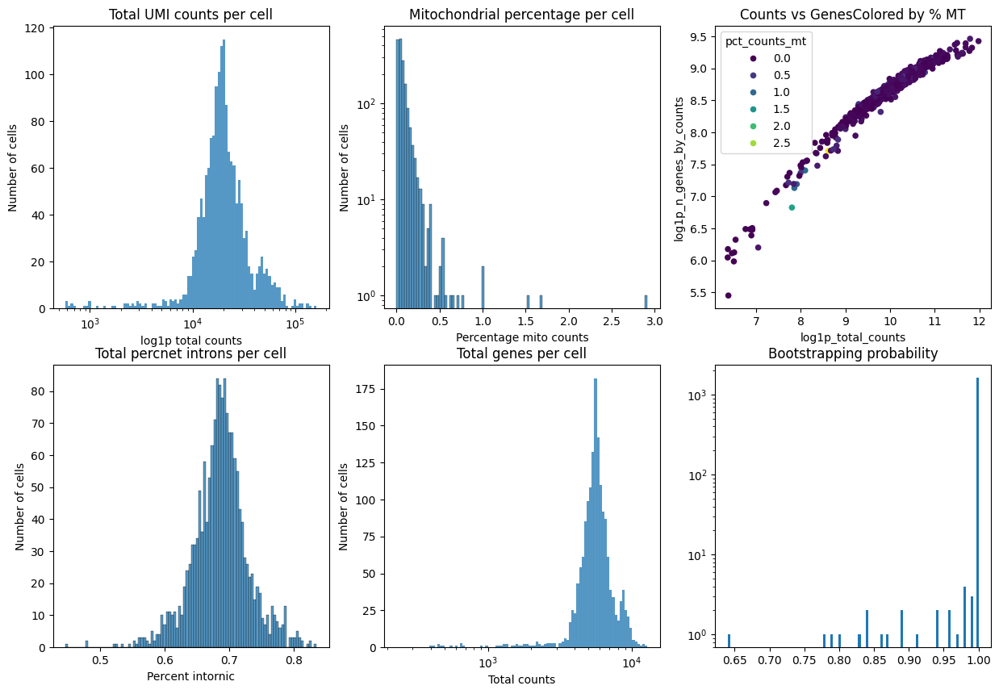

{'min_UMI': 4170, 'max_UMI': 105464, 'min_genes': 2052, 'mt_threshold': 3.0}
Assure that adata.var.index has same gene name of makers...


  0%|          | 0/4 [00:00<?, ?it/s]

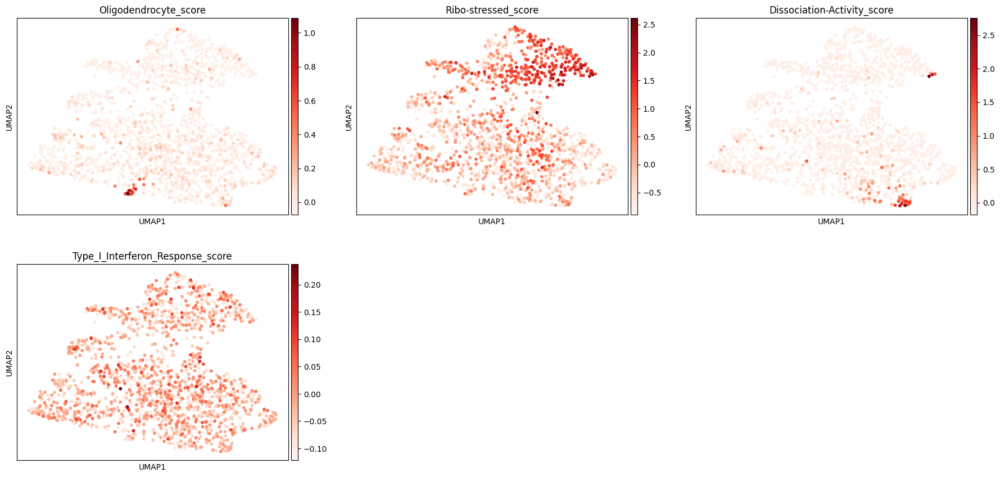

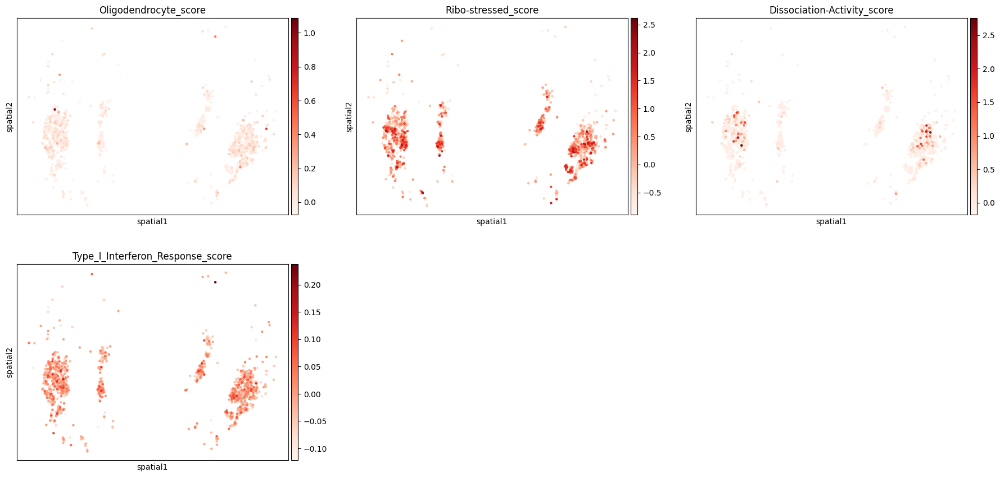

AnnData object with n_obs × n_vars = 1653 × 26149
    obs: 'x', 'y', 'pct_intronic', 'is_cell', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'my_hierarchy_all', 'library', 'library_name', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'leiden_scANVI', 'mapping_MSN_for_zoning', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'Oligoden

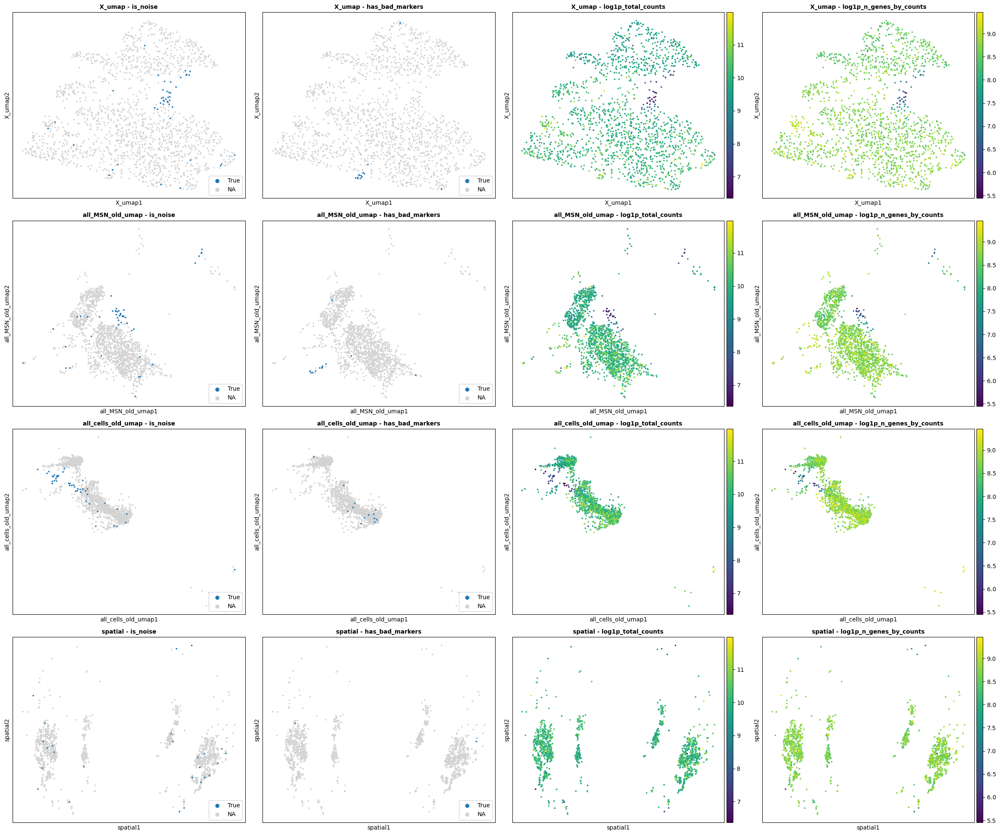


        #########################
        ### D2 Matrix MSN
        #########################
        
   Genes before filtering: 31141
   Genes after filtering: 27335
Expect .X is raw counts!
Normalizing...
Findingn HVGs...
Scaling...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Calculating PCA...
Calculating neighbors...
Calculating Umap...
Clutering...
Preprocessing done.


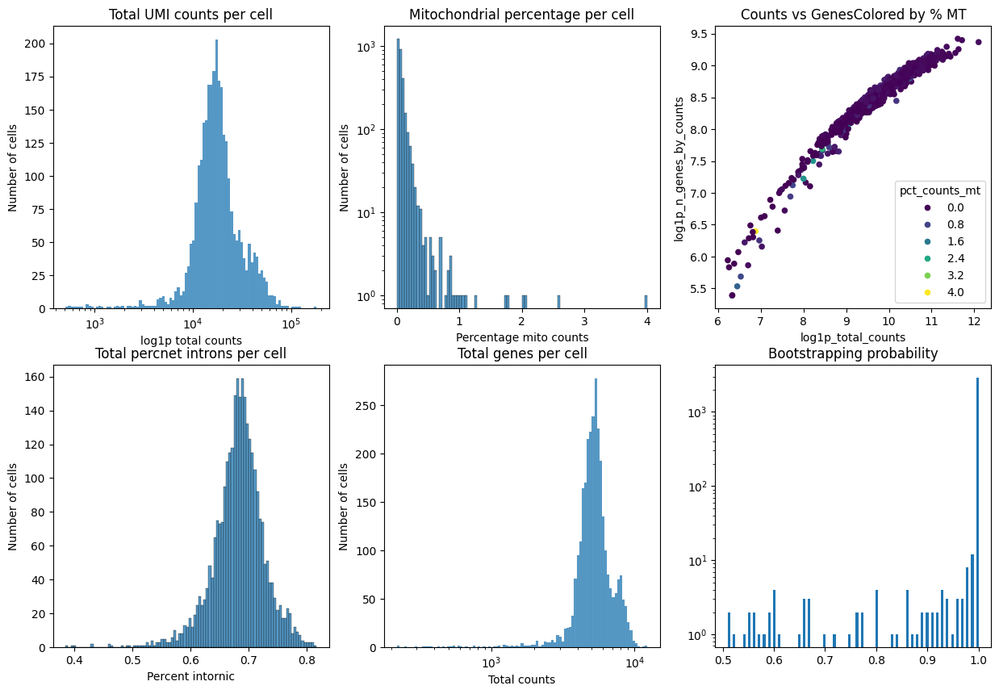

{'min_UMI': 4527, 'max_UMI': 75450, 'min_genes': 2118, 'mt_threshold': 3.0}
Assure that adata.var.index has same gene name of makers...


  0%|          | 0/4 [00:00<?, ?it/s]

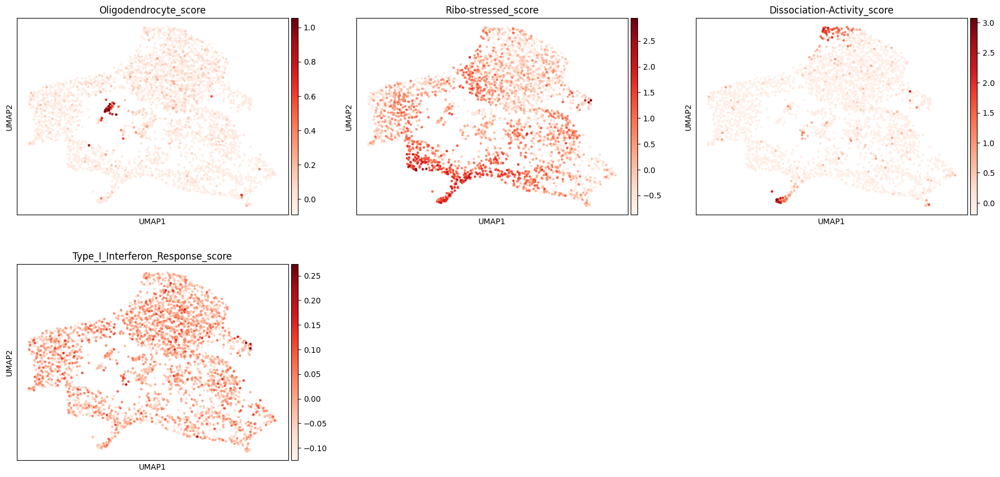

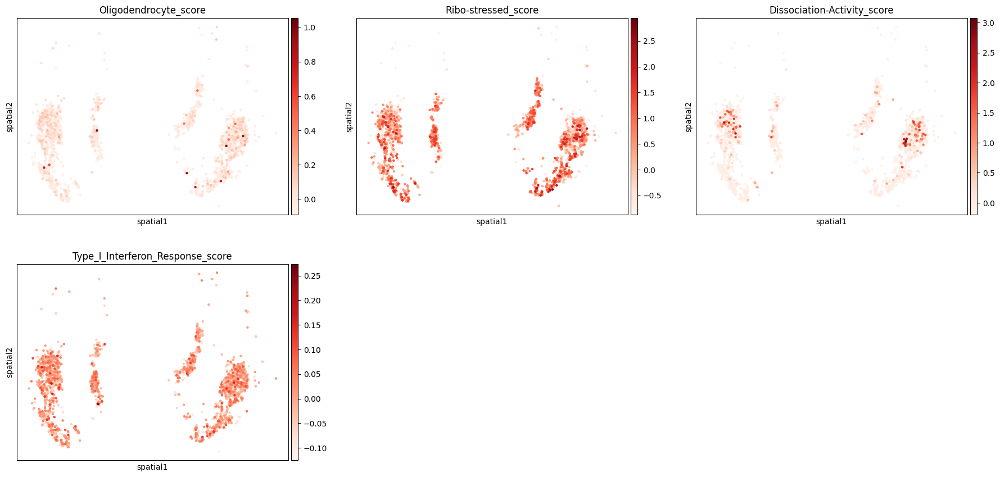

AnnData object with n_obs × n_vars = 2975 × 27335
    obs: 'x', 'y', 'pct_intronic', 'is_cell', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'my_hierarchy_all', 'library', 'library_name', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'leiden_scANVI', 'mapping_MSN_for_zoning', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'Oligoden

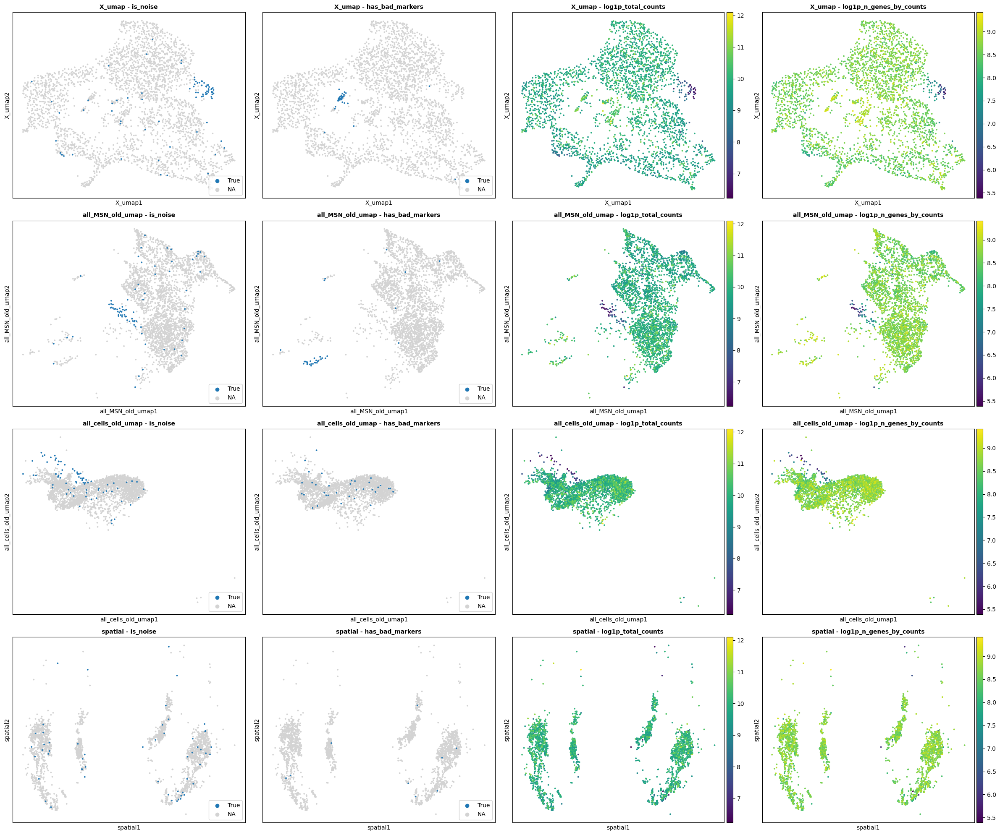


        #########################
        ### STRv D1 NUDAP MSN
        #########################
        
   Genes before filtering: 31141
   Genes after filtering: 27903
Expect .X is raw counts!
Normalizing...
Findingn HVGs...
Scaling...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Calculating PCA...
Calculating neighbors...
Calculating Umap...
Clutering...
Preprocessing done.


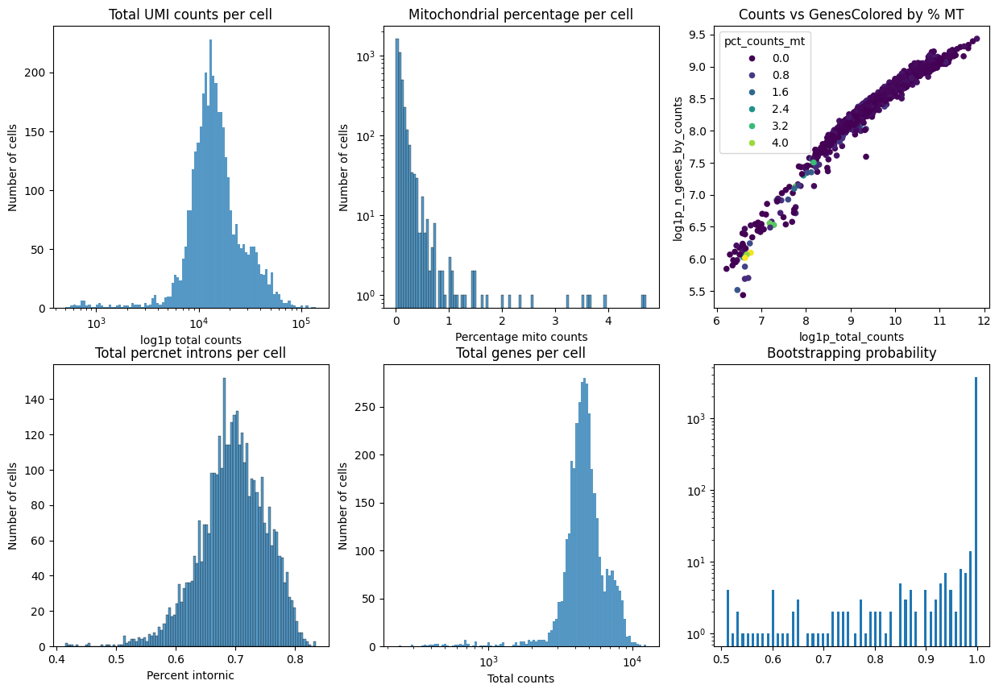

{'min_UMI': 3227, 'max_UMI': 73638, 'min_genes': 1681, 'mt_threshold': 3.0}
Assure that adata.var.index has same gene name of makers...


  0%|          | 0/4 [00:00<?, ?it/s]

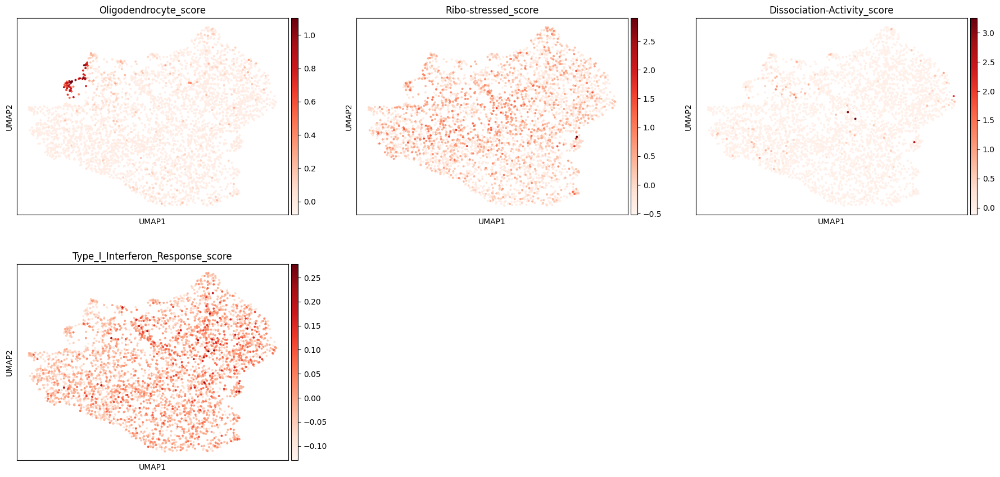

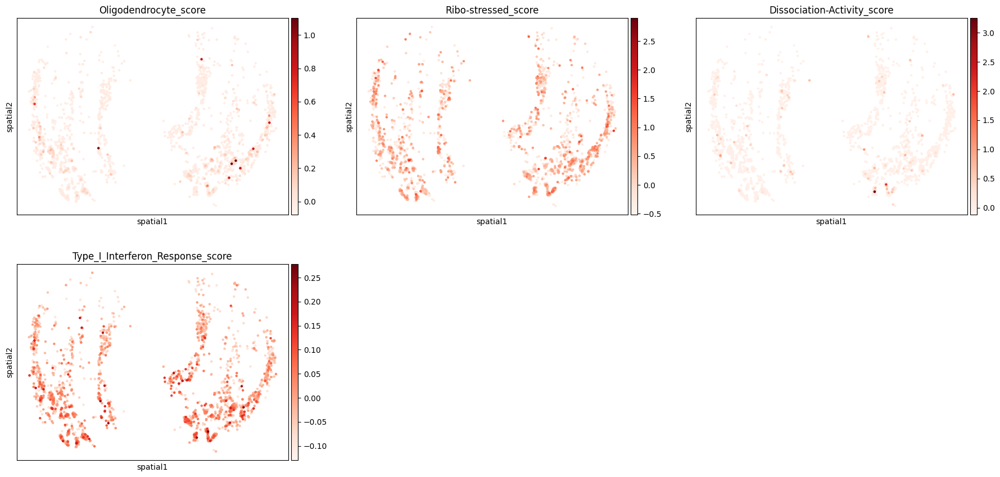

AnnData object with n_obs × n_vars = 3804 × 27903
    obs: 'x', 'y', 'pct_intronic', 'is_cell', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'my_hierarchy_all', 'library', 'library_name', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'leiden_scANVI', 'mapping_MSN_for_zoning', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'Oligoden

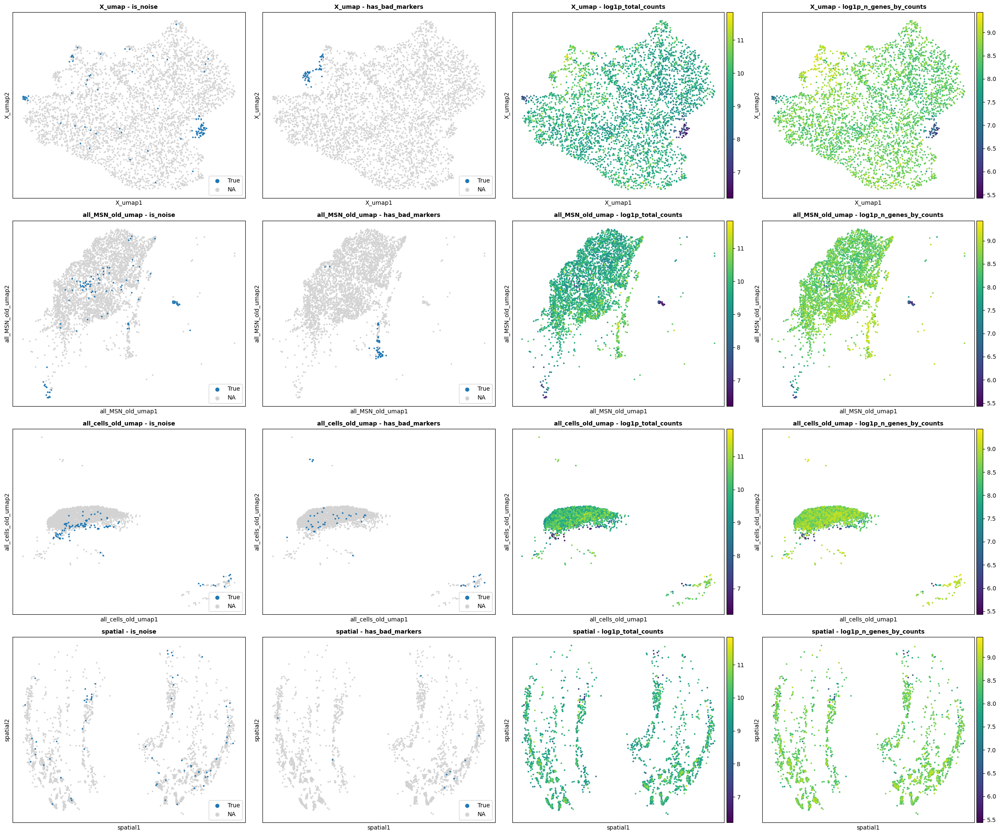


        #########################
        ### STRd D2 StrioMat Hybrid MSN
        #########################
        
   Genes before filtering: 31141
   Genes after filtering: 21857
Expect .X is raw counts!
Normalizing...
Findingn HVGs...
Scaling...
Calculating PCA...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Calculating neighbors...
Calculating Umap...
Clutering...
Preprocessing done.


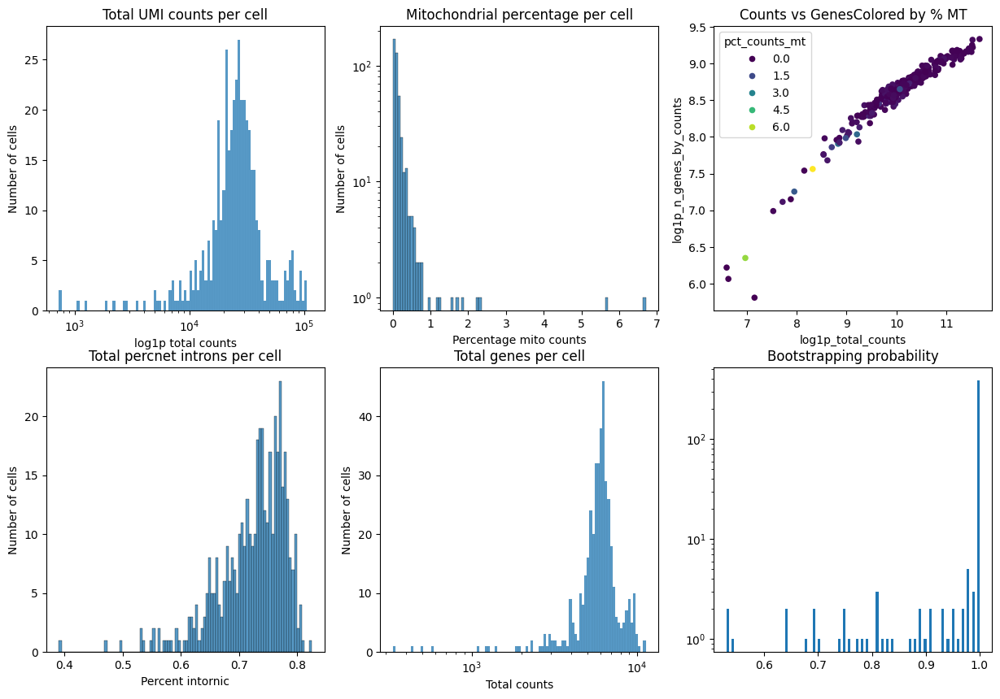

{'min_UMI': 3860, 'max_UMI': 100982, 'min_genes': 1908, 'mt_threshold': 3.0}
Assure that adata.var.index has same gene name of makers...


  0%|          | 0/4 [00:00<?, ?it/s]

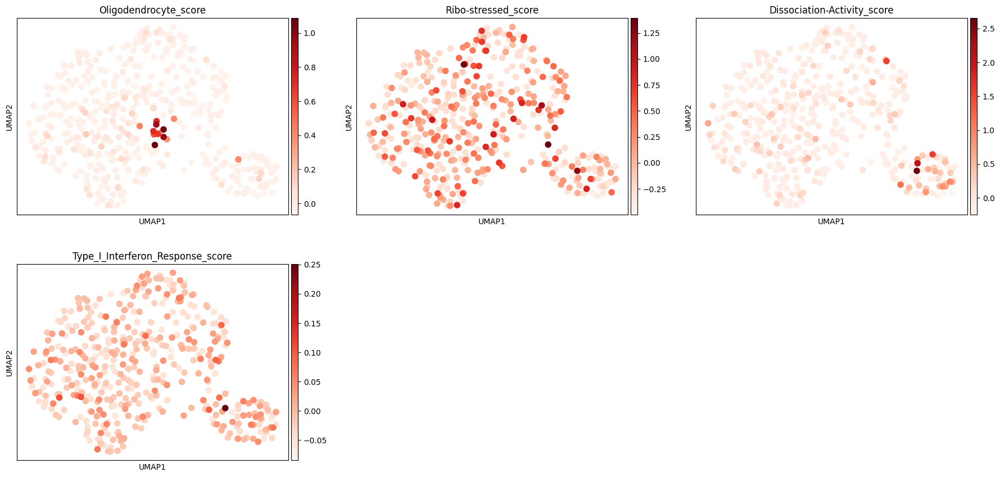

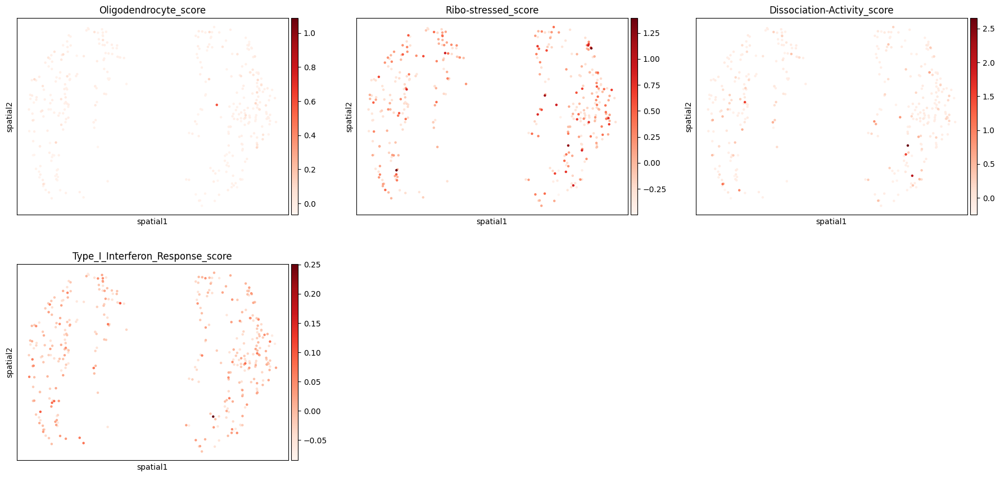

AnnData object with n_obs × n_vars = 432 × 21857
    obs: 'x', 'y', 'pct_intronic', 'is_cell', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'my_hierarchy_all', 'library', 'library_name', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'leiden_scANVI', 'mapping_MSN_for_zoning', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'Oligodend

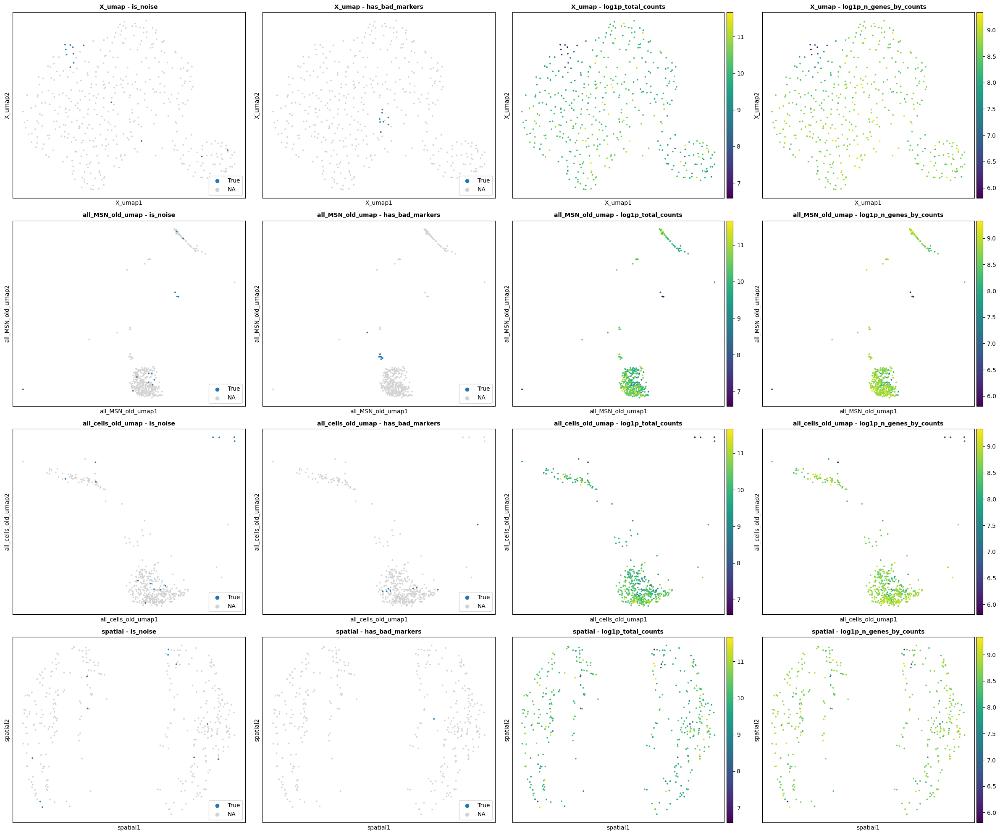


        #########################
        ### STRd D1 Striosome MSN
        #########################
        
   Genes before filtering: 31141
   Genes after filtering: 22843
Expect .X is raw counts!
Normalizing...
Findingn HVGs...
Scaling...
Calculating PCA...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Calculating neighbors...
Calculating Umap...
Clutering...
Preprocessing done.


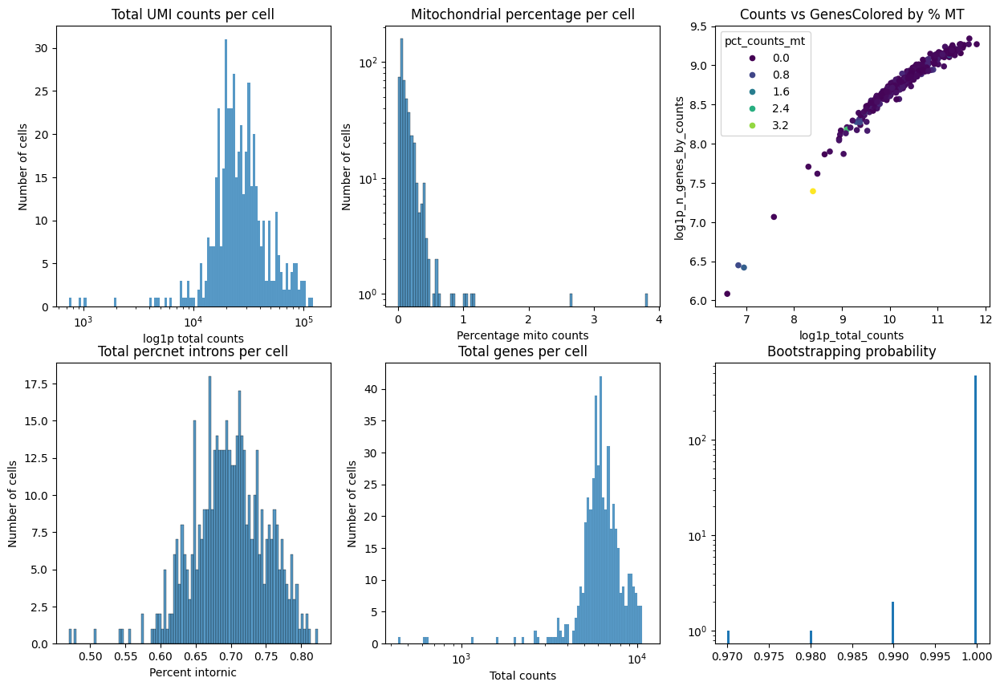

{'min_UMI': 7633, 'max_UMI': 110693, 'min_genes': 2912, 'mt_threshold': 3.0}
Assure that adata.var.index has same gene name of makers...


  0%|          | 0/4 [00:00<?, ?it/s]

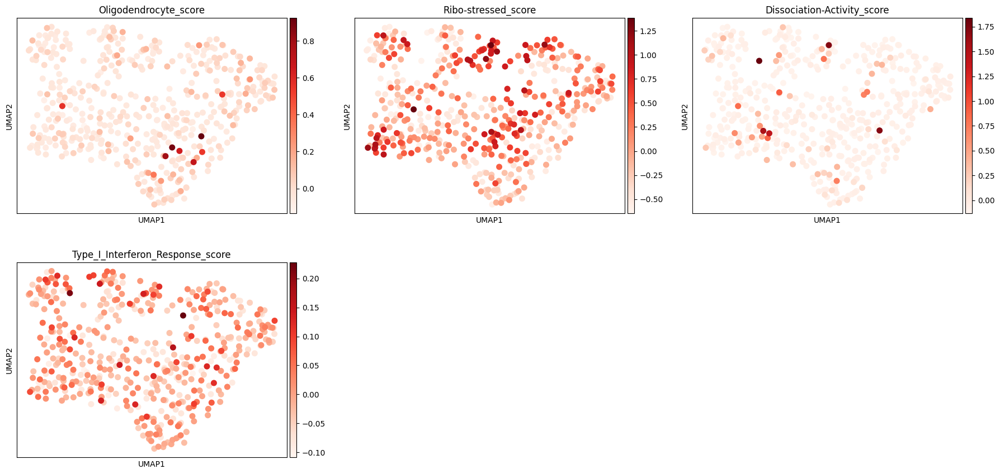

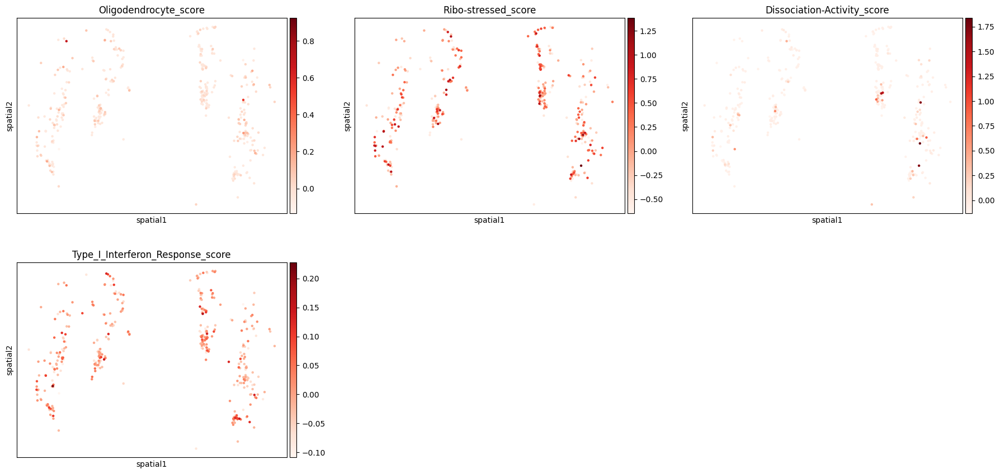

AnnData object with n_obs × n_vars = 477 × 22843
    obs: 'x', 'y', 'pct_intronic', 'is_cell', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'my_hierarchy_all', 'library', 'library_name', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'leiden_scANVI', 'mapping_MSN_for_zoning', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'Oligodend

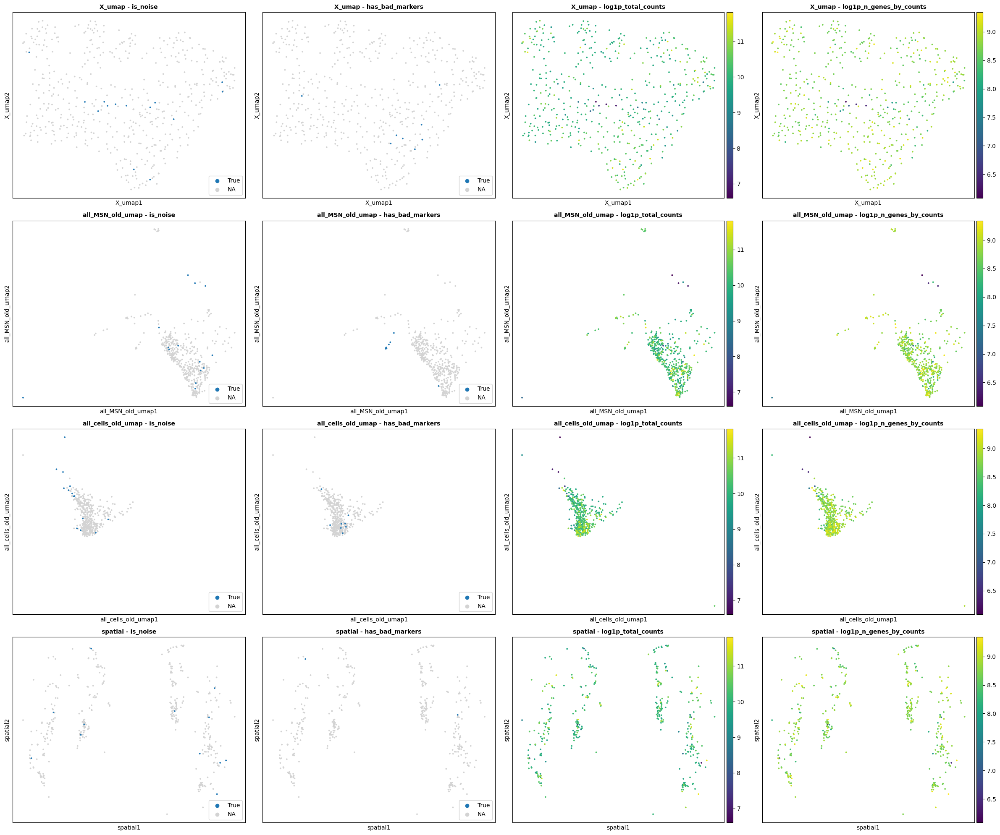


        #########################
        ### STR D1D2 Hybrid MSN
        #########################
        
   Genes before filtering: 31141
   Genes after filtering: 24494
Expect .X is raw counts!
Normalizing...
Findingn HVGs...
Scaling...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Calculating PCA...
Calculating neighbors...
Calculating Umap...
Clutering...
Preprocessing done.


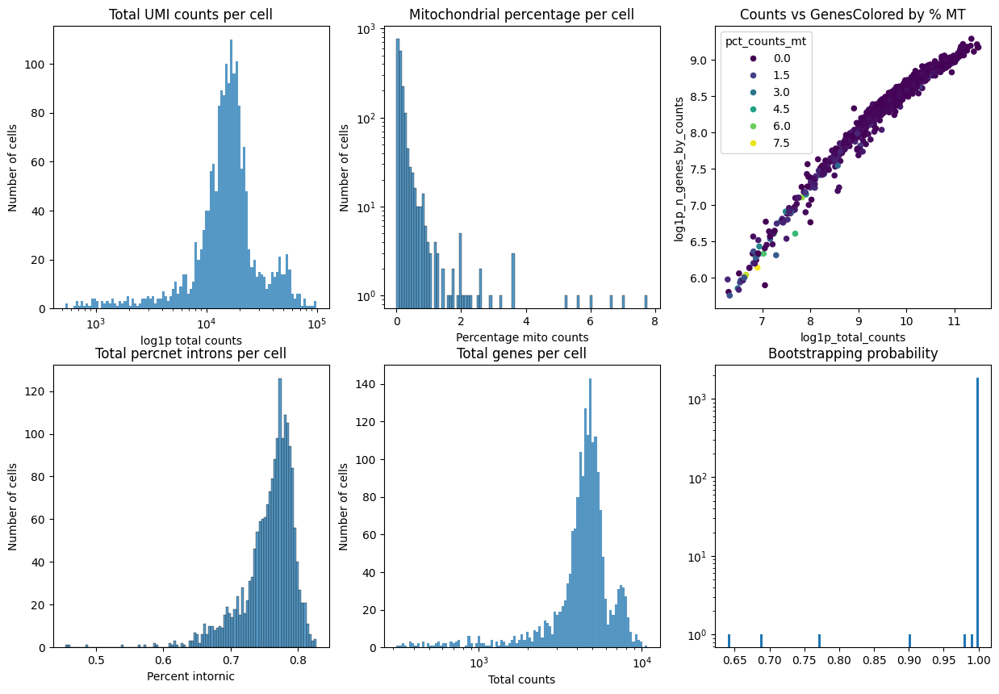

{'min_UMI': 1406, 'max_UMI': 75813, 'min_genes': 738, 'mt_threshold': 3.0}
Assure that adata.var.index has same gene name of makers...


  0%|          | 0/4 [00:00<?, ?it/s]

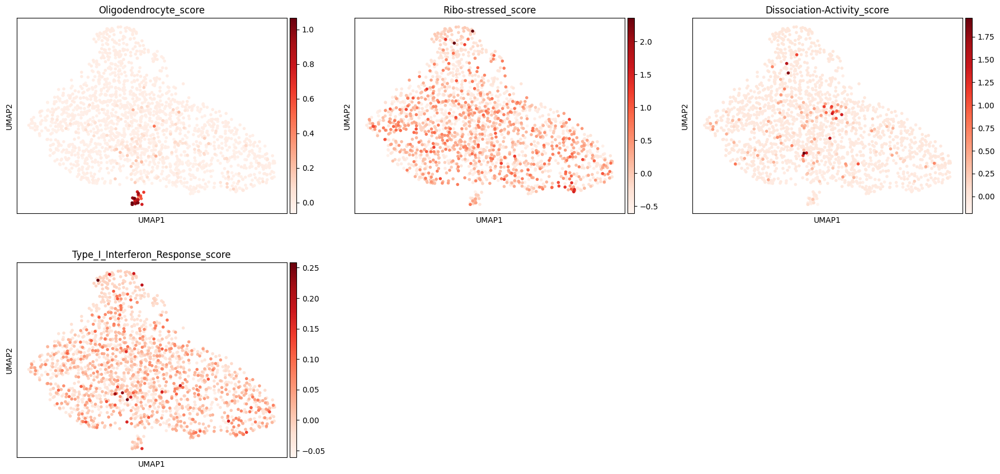

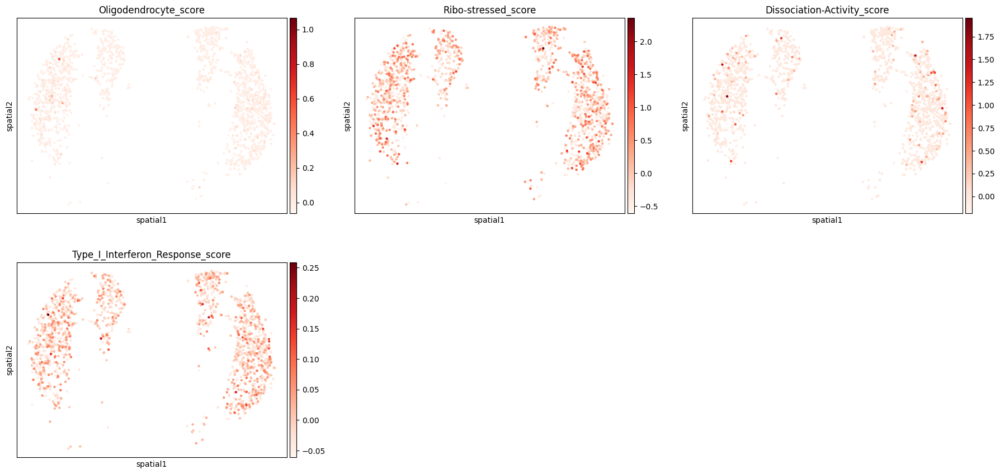

AnnData object with n_obs × n_vars = 1860 × 24494
    obs: 'x', 'y', 'pct_intronic', 'is_cell', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'my_hierarchy_all', 'library', 'library_name', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'leiden_scANVI', 'mapping_MSN_for_zoning', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'Oligoden

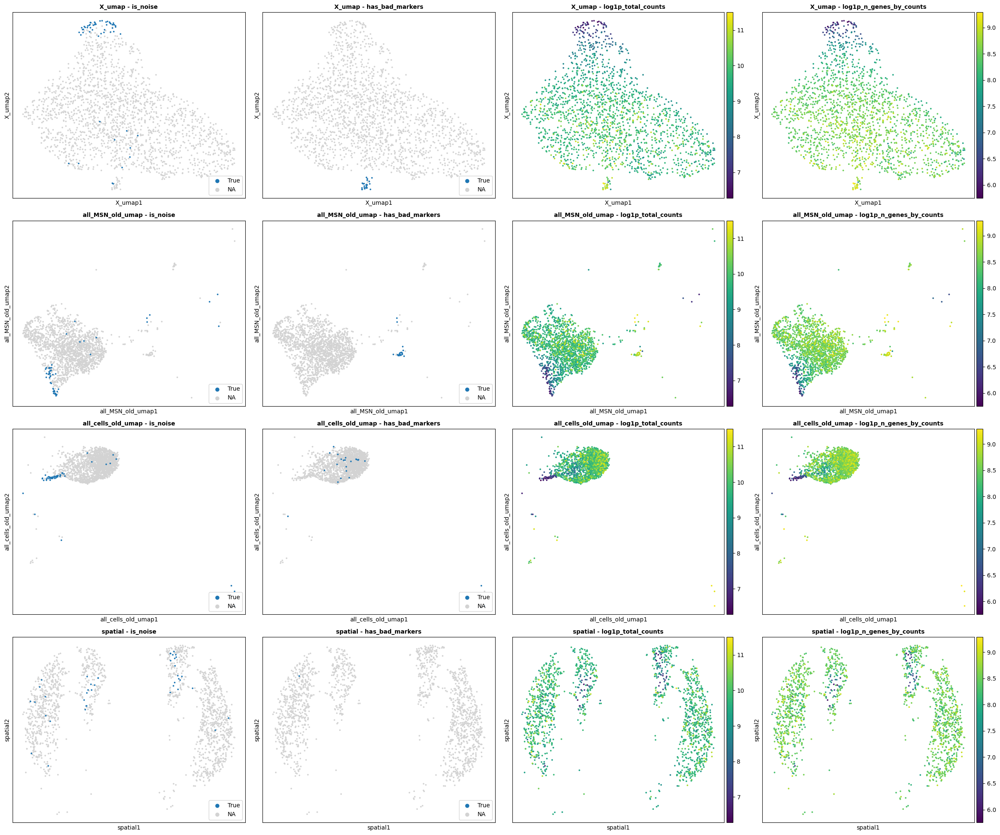


        #########################
        ### STRd D2 Striosome MSN
        #########################
        
   Genes before filtering: 31141
   Genes after filtering: 21528
Expect .X is raw counts!
Normalizing...
Findingn HVGs...
Scaling...
Calculating PCA...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Calculating neighbors...
Calculating Umap...
Clutering...
Preprocessing done.


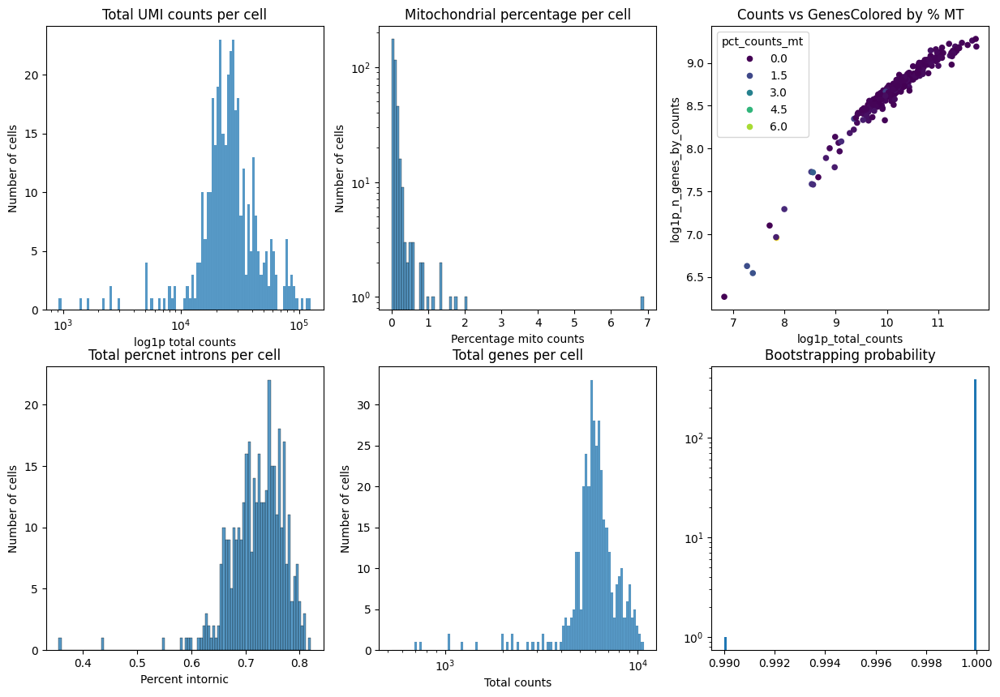

{'min_UMI': 5070, 'max_UMI': 117023, 'min_genes': 1962, 'mt_threshold': 3.0}
Assure that adata.var.index has same gene name of makers...


  0%|          | 0/4 [00:00<?, ?it/s]

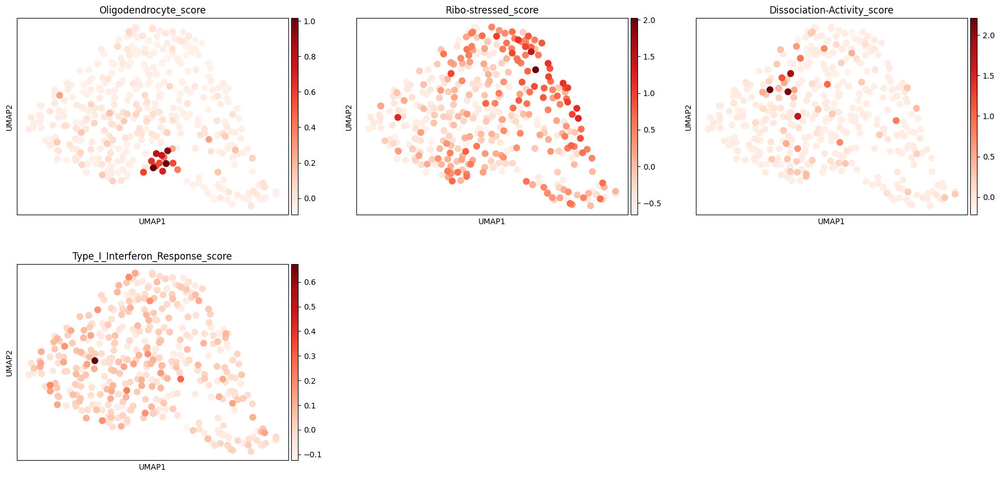

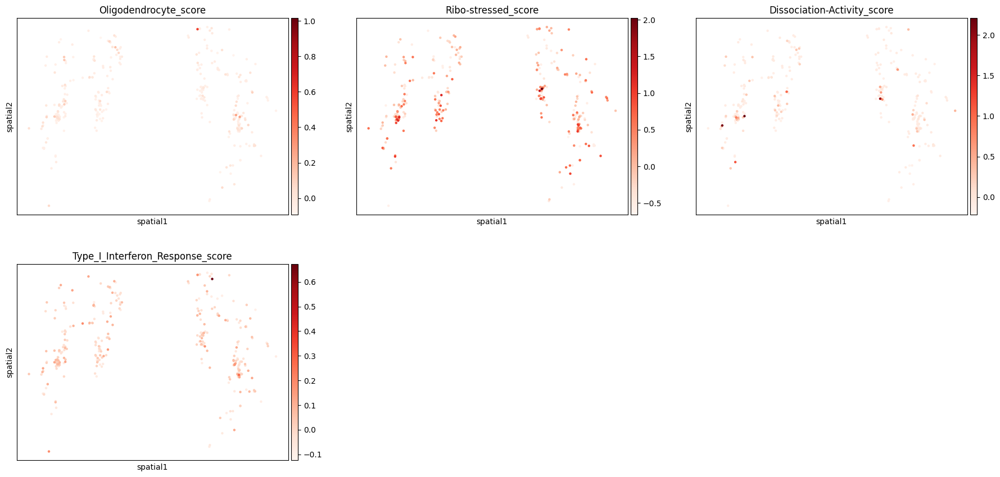

AnnData object with n_obs × n_vars = 385 × 21528
    obs: 'x', 'y', 'pct_intronic', 'is_cell', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'my_hierarchy_all', 'library', 'library_name', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'leiden_scANVI', 'mapping_MSN_for_zoning', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'Oligodend

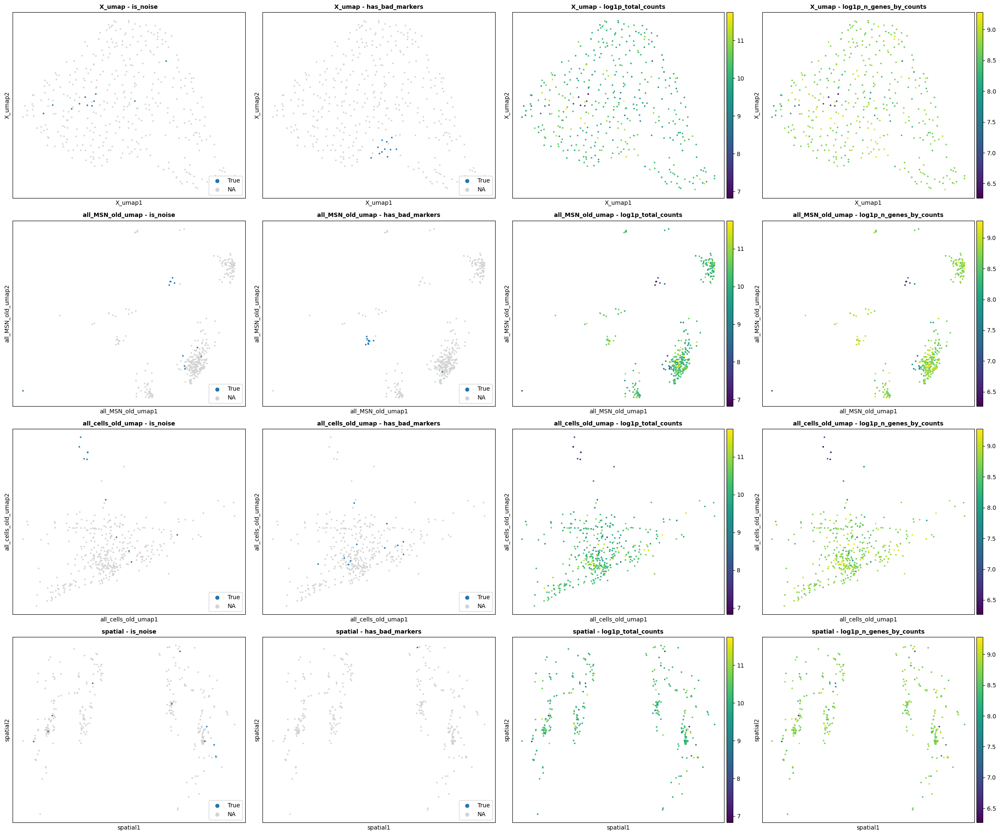

In [10]:
good_MSN_barcodes = set()

for ct in adata_MSN.obs[MSN_CONSIDERED_OBS_COL].unique().tolist():
    l, _ = filter_single_ct(adata_MSN, ct, MSN_CONSIDERED_OBS_COL, min_percentile=2, max_percentile=99.5, mit_thr=3)
    good_MSN_barcodes.update(l)

In [11]:
# good_MSN_barcodes = set()

# # Calculate all filters (keep = pass filter)
# filters_thr = { # lists of boolen (True == to keep)
#     'min_UMI': 6000,
#     'max_UMI': 200000, # 100000 sample_01
#     'min_genes': 3000, 
#     'mt_threshold': 3,
# }
# l, _ = filter_single_ct(adata_MSN, "D1 Matrix MSN", MSN_CONSIDERED_OBS_COL, filters_thr)
# good_MSN_barcodes.update(l)

# filters_thr = { # lists of boolen (True == to keep)
#     'min_UMI': 6000,
#     'max_UMI': 200000,
#     'min_genes': 3000, 
#     'mt_threshold': 3,
# }
# l, _ = filter_single_ct(adata_MSN, "D2 Matrix MSN", MSN_CONSIDERED_OBS_COL, filters_thr)
# good_MSN_barcodes.update(l)

# filters_thr = { # lists of boolen (True == to keep)
#     'min_UMI': 4000,
#     'max_UMI': 200000,
#     'min_genes': 2000, 
#     'mt_threshold': 3,
# }
# l, _ = filter_single_ct(adata_MSN, "STRv D1 NUDAP MSN", MSN_CONSIDERED_OBS_COL, filters_thr)
# good_MSN_barcodes.update(l)

# filters_thr = { # lists of boolen (True == to keep)
#     'min_UMI': 6000,
#     'max_UMI': 200000,
#     'min_genes': 3000, 
#     'mt_threshold': 3,
# }
# l, _ = filter_single_ct(adata_MSN, "STRd D2 StrioMat Hybrid MSN", MSN_CONSIDERED_OBS_COL, filters_thr)
# good_MSN_barcodes.update(l)

# filters_thr = { # lists of boolen (True == to keep)
#     'min_UMI': 6000,
#     'max_UMI': 200000,
#     'min_genes': 3000, 
#     'mt_threshold': 3,
# }
# l, _ = filter_single_ct(adata_MSN, "STRd D1 Striosome MSN", MSN_CONSIDERED_OBS_COL, filters_thr)
# good_MSN_barcodes.update(l)

# filters_thr = { # lists of boolen (True == to keep)
#     'min_UMI': 1000,
#     'max_UMI': 200000,
#     'min_genes': 1000, 
#     'mt_threshold': 3,
# }
# l, _ = filter_single_ct(adata_MSN, "STR D1D2 Hybrid MSN", MSN_CONSIDERED_OBS_COL, filters_thr)
# good_MSN_barcodes.update(l)

# filters_thr = { # lists of boolen (True == to keep)
#     'min_UMI': 10000,
#     'max_UMI': 200000,
#     'min_genes': 4000, 
#     'mt_threshold': 3,
# }
# l, _ = filter_single_ct(adata_MSN, "STRd D2 Striosome MSN", MSN_CONSIDERED_OBS_COL, filters_thr)
# good_MSN_barcodes.update(l)

# Filter out bad cells

In [12]:
bad_MSN_barcodes = all_MSN_barcodes.difference(good_MSN_barcodes)

print(adata)
adata = adata[~adata.obs_names.isin(bad_MSN_barcodes)]
adata_MSN = adata_MSN[~adata_MSN.obs_names.isin(bad_MSN_barcodes)]
print(adata)

AnnData object with n_obs × n_vars = 85645 × 32780
    obs: 'x', 'y', 'pct_intronic', 'is_cell', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'my_hierarchy_all', 'library', 'library_name', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'leiden_scANVI', 'mapping_MSN_for_zoning'
    var: 'feature_types', 'genome', 'gene_symbol', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'

# TAFA1

Split some cell type in TAFA1 version


        #########################
        ### D1 Matrix MSN
        #########################
        
   Genes before filtering: 32780
   Genes after filtering: 25870
Expect .X is raw counts!
Normalizing...
Findingn HVGs...
Scaling...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Calculating PCA...
Calculating neighbors...
Calculating Umap...
Clutering...
Preprocessing done.
Assure that adata.var.index has same gene name of makers...


  0%|          | 0/1 [00:00<?, ?it/s]

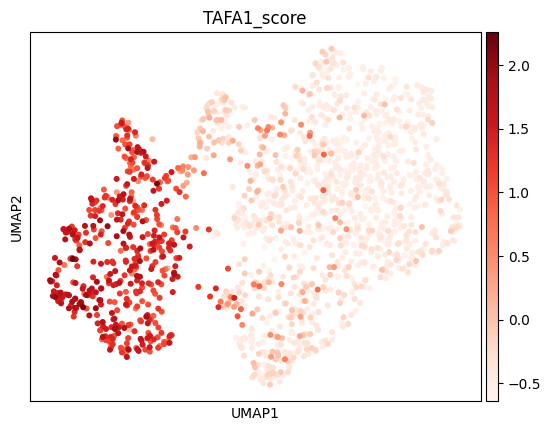

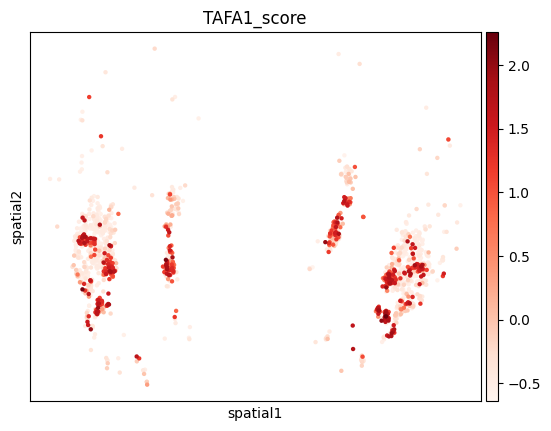

/tmp/ipykernel_1834843/311829807.py:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores = adata_ct.obs.groupby("leiden_1")["TAFA1_score"].mean()


Cluster with highest TAFA1 score: 1
Mean scores per cluster:
leiden_1
1    1.274789
0   -0.364882
Name: TAFA1_score, dtype: float64


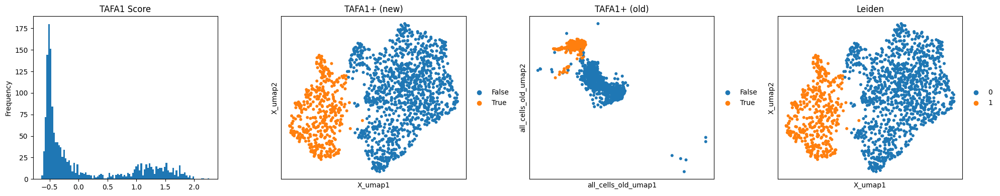

/tmp/ipykernel_1834843/311829807.py:40: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["Group_name"] = adata.obs["Group_name"].astype(str)



        #########################
        ### D2 Matrix MSN
        #########################
        
   Genes before filtering: 32780
   Genes after filtering: 27055
Expect .X is raw counts!
Normalizing...
Findingn HVGs...
Scaling...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Calculating PCA...
Calculating neighbors...
Calculating Umap...
Clutering...
Preprocessing done.
Assure that adata.var.index has same gene name of makers...


  0%|          | 0/1 [00:00<?, ?it/s]

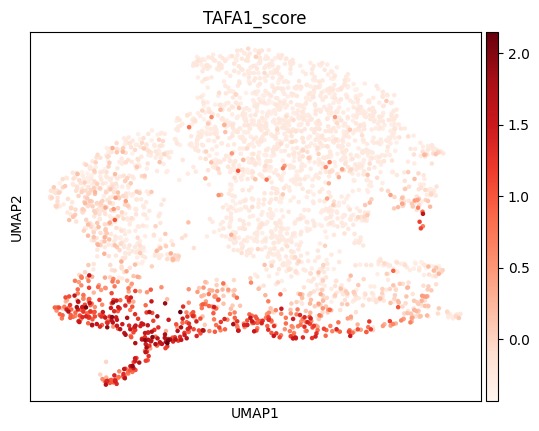

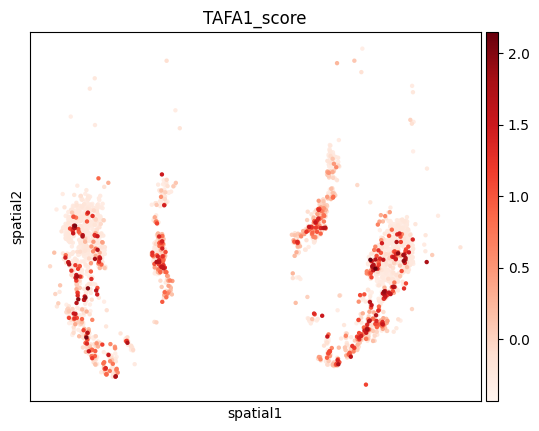

/tmp/ipykernel_1834843/311829807.py:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores = adata_ct.obs.groupby("leiden_1")["TAFA1_score"].mean()


Cluster with highest TAFA1 score: 0
Mean scores per cluster:
leiden_1
0    0.587314
2   -0.155360
1   -0.232860
Name: TAFA1_score, dtype: float64


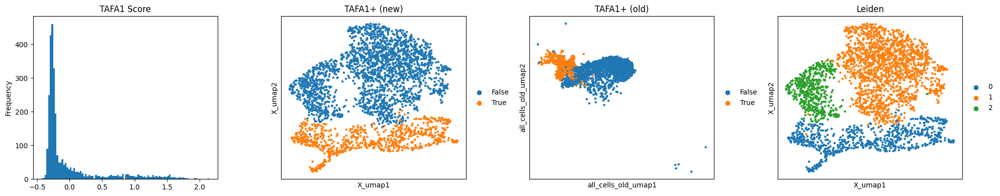


        #########################
        ### STRd D2 StrioMat Hybrid MSN
        #########################
        
   Genes before filtering: 32780
   Genes after filtering: 21580
Expect .X is raw counts!
Normalizing...
Findingn HVGs...
Scaling...
Calculating PCA...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Calculating neighbors...
Calculating Umap...
Clutering...
Preprocessing done.
Assure that adata.var.index has same gene name of makers...


  0%|          | 0/1 [00:00<?, ?it/s]

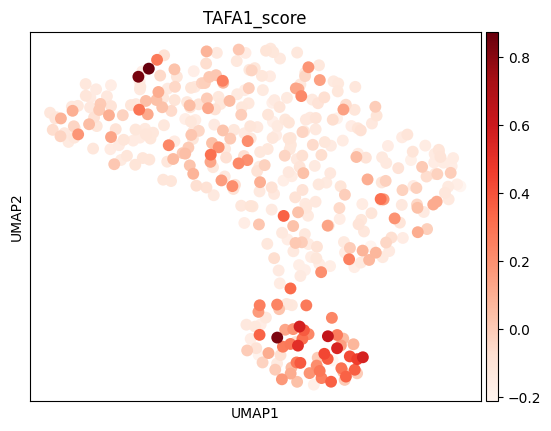

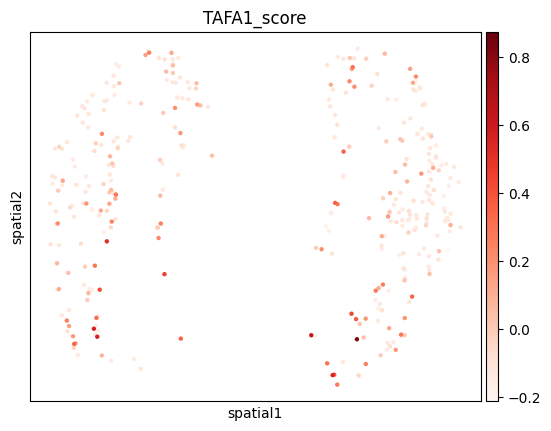

/tmp/ipykernel_1834843/311829807.py:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores = adata_ct.obs.groupby("leiden_1")["TAFA1_score"].mean()


Cluster with highest TAFA1 score: 1
Mean scores per cluster:
leiden_1
1    0.163217
0   -0.060590
Name: TAFA1_score, dtype: float64


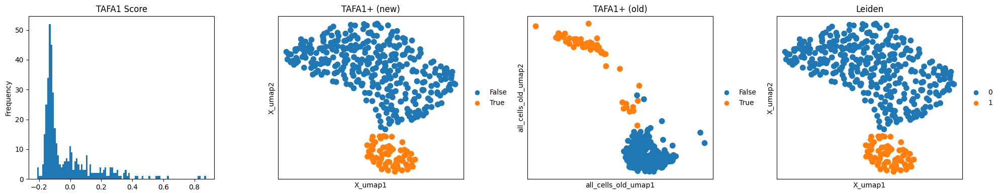

In [13]:
for ct in ["D1 Matrix MSN", "D2 Matrix MSN", "STRd D2 StrioMat Hybrid MSN"]:

    print(
        f"""
        #########################
        ### {ct}
        #########################
        """
    )

    # Select single ct
    adata_ct = adata[adata.obs[MSN_CONSIDERED_OBS_COL] == ct].copy()

    # Reprocess + calculate QC
    preprocessing.reprocess_subset(adata_ct, old_umap_name="all_cells")

    # Calculate TAFA1 markers gene score
    preprocessing.calculate_and_plot_markers(adata_ct, {"TAFA1": ["ENSG00000183662", "ENSG00000145242", "ENSG00000157542"]}) # TAFA1, EPHA5, KCNJ6

    # Calculate mean score per cluster
    cluster_scores = adata_ct.obs.groupby("leiden_1")["TAFA1_score"].mean()
    
    # Find cluster with highest mean score
    highest_score_cluster = cluster_scores.idxmax()
    
    print(f"Cluster with highest TAFA1 score: {highest_score_cluster}")
    print(f"Mean scores per cluster:\n{cluster_scores.sort_values(ascending=False)}")
    
    # Mark cells in the highest-scoring cluster as TAFA1+
    adata_ct.obs["is_tafa1"] = adata_ct.obs["leiden_1"] == highest_score_cluster

    fig, axes = plt.subplots(1, 4, figsize=(20, 4))
    adata_ct.obs.TAFA1_score.plot(kind="hist", bins=100, ax=axes[0], title="TAFA1 Score")
    sc.pl.embedding(adata_ct, basis="X_umap", color="is_tafa1", ax=axes[1], show=False, title="TAFA1+ (new)")
    sc.pl.embedding(adata_ct, basis="all_cells_old_umap", color="is_tafa1", ax=axes[2], show=False, title="TAFA1+ (old)")
    sc.pl.embedding(adata_ct, basis="X_umap", color="leiden_1", ax=axes[3], show=False, title="Leiden")
    plt.tight_layout(); plt.show()

    # ATTENTION: change label in adata
    adata.obs["Group_name"] = adata.obs["Group_name"].astype(str)
    adata.obs.loc[adata_ct.obs_names[adata_ct.obs.is_tafa1], "Group_name"] = f"Tafa1 {ct}"
    adata.obs["Group_name"] = adata.obs["Group_name"].astype("category") 

    #break

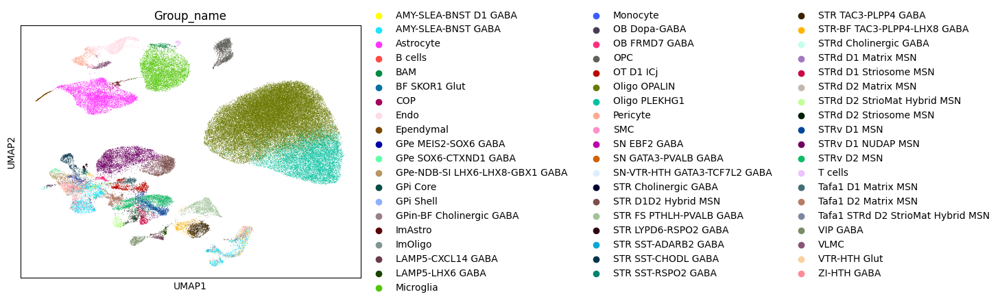

In [14]:
sc.pl.umap(adata, color="Group_name")

# Save

In [15]:
adata.write(f'{BASE_PATH}/{DISEASE_TYPE}/{SAMPLE_ID}/adata/all_lib_adata_cell_type_MSN_QCed.h5ad')

# Save Notebook

In [16]:
# Get the notebook path
notebook_path = str(ipynbname.path())
print(f"Current notebook: {notebook_path}")

# Save it
base_name = os.path.basename(notebook_path).replace('.ipynb', '')  # Remove .ipynb
saving_path = f"{BASE_PATH}/{DISEASE_TYPE}/{SAMPLE_ID}/notebooks/{base_name}_{SAMPLE_ID}.ipynb"
print(f"Saved to {saving_path}")

print("\n   Press Ctrl+S")

Current notebook: /home/gdallagl/myworkdir/XDP/script/single_sample_analysis/07_MSN_preprocessing.ipynb
Saved to /home/gdallagl/myworkdir/data/XDP/diseased/sample_01/notebooks/07_MSN_preprocessing_sample_01.ipynb

   Press Ctrl+S


In [17]:
shutil.copy(notebook_path, saving_path)

'/home/gdallagl/myworkdir/data/XDP/diseased/sample_01/notebooks/07_MSN_preprocessing_sample_01.ipynb'

----
---
---